Steps:
1. pick a station and get lat/lon of station
2. get hls l30 and s30 granules for that lat/lon going back to 2015
3. use dates of those hls granules to query for snow depth point data
4. save to a table for that station

In [ ]:
# Imports
from datetime import datetime
import pandas as pd
import earthaccess
import requests
import rioxarray
from pyproj import Transformer

/Users/aimeebarciauskas/github/ski-project/ski-project/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. Pick a station

In [2]:
# Get lat/lon of SNOTEL stations
snotel_stations = pd.read_json("snotel-wa-stations.json")
snotel_api = "https://wcc.sc.egov.usda.gov/awdbRestApi/services/v1/data"
station_triplet = "908:WA:SNTL"
station_lat, station_lon = snotel_stations[snotel_stations.stationTriplet == station_triplet].latitude.values[0], snotel_stations[snotel_stations.stationTriplet == station_triplet].longitude.values[0]


# 2. Find HLS L30 and S30 data coincident with this SNOTEL station

In [12]:
earthaccess.login(strategy='interactive')

In [14]:
start_date, end_date = "2015-01-01", "2025-08-23"

In [16]:

hls_granules = []

for hls_collection in ['HLSL30', 'HLSS30']:
    hls_granules.extend(earthaccess.search_data(
        short_name=hls_collection,
        bounding_box=(station_lon, station_lat, station_lon, station_lat),
        temporal=(start_date, end_date)
    ))

len(hls_granules)

2365

In [18]:
lpdaac_fs = earthaccess.get_fsspec_https_session()

# Intermission: Displaying HLS data and station


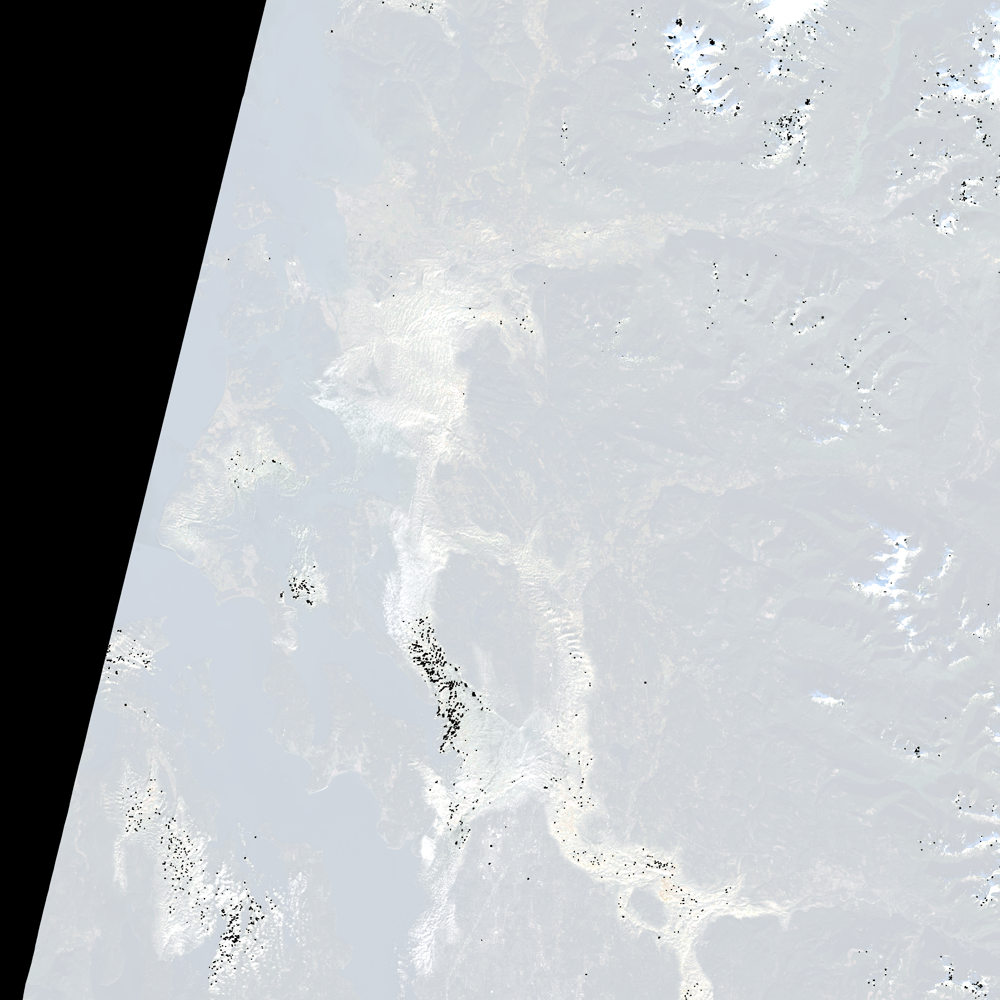

In [21]:

import base64
import folium
import io
from PIL import Image
import numpy as np
import rasterio
from IPython.display import HTML

first_granule = hls_granules[0]
bounding_points = first_granule["umm"]["SpatialExtent"]["HorizontalSpatialDomain"]["Geometry"]["GPolygons"][0]["Boundary"]["Points"]

latitudes = [point["Latitude"] for point in bounding_points]
longitudes = [point["Longitude"] for point in bounding_points]

hls_granule_bounds = [
    [min(latitudes), min(longitudes)],
    [max(latitudes), max(longitudes)]
]

bands_to_files = {link.split('/')[-1].split('.')[-2]: link for link in first_granule.data_links()}
bands_to_files

blue = rasterio.open(lpdaac_fs.open(bands_to_files['B02'])).read(1)
green = rasterio.open(lpdaac_fs.open(bands_to_files['B03'])).read(1)
red = rasterio.open(lpdaac_fs.open(bands_to_files['B04'])).read(1)

rgb = np.stack([red, green, blue], axis=0)

# Normalize the data for visualization (0-1 range)
def normalize_band(band):
    band_min = np.nanpercentile(band, 2)  # 2nd percentile
    band_max = np.nanpercentile(band, 98)  # 98th percentile
    return (band - band_min) / (band_max - band_min)

rgb_normalized = np.stack([
    normalize_band(red),
    normalize_band(green), 
    normalize_band(blue)
], axis=0)

# Clip to valid range
rgb_normalized = np.clip(rgb_normalized, 0, 1)

# Convert to 8-bit (0-255)
rgb_8bit = (rgb_normalized * 255).astype(np.uint8)

# Convert your rgb_8bit to base64
rgb_image = Image.fromarray(np.transpose(rgb_8bit, (1, 2, 0)))
img_buffer = io.BytesIO()
rgb_image.save(img_buffer, format='PNG')
img_buffer.seek(0)
img_str = base64.b64encode(img_buffer.read()).decode()


# Create the map
m = folium.Map(
    location=[station_lat, station_lon],
    zoom_start=7,
    tiles='OpenStreetMap'
)

folium.raster_layers.ImageOverlay(
    name='True Color Image',
    image=f'data:image/png;base64,{img_str}',
    bounds=hls_granule_bounds,
    opacity=0.8,
    popup='HLS True Color Image'
).add_to(m)

folium.CircleMarker(
    location=[station_lat, station_lon],
    radius=5,
    color='green',
    fill=True,
    fillOpacity=0.7
).add_to(m)

# Display with custom size using HTML
html = m._repr_html_()
html_with_size = f'<div style="width: 500px; height: 500px;">{html}</div>'
HTML(html_with_size)


# 3. For each granule, find the snotel data for the same date

In [22]:
first_granule = hls_granules[0]

In [23]:
temporal_data = first_granule["umm"]["TemporalExtent"]["RangeDateTime"]
begin_date, end_date = temporal_data["BeginningDateTime"], temporal_data["EndingDateTime"]

begin_date, end_date

('2015-01-14T18:55:17.190Z', '2015-01-14T18:55:41.073Z')

In [ ]:
# Parameters for the request
params = {
    'stationTriplets': station_triplet,
    'elements': 'SNWD',
    'duration': 'DAILY',
    'beginDate': datetime.strptime(begin_date, "%Y-%m-%dT%H:%M:%S.%fZ").strftime("%Y-%m-%d %H:%M"),
    'endDate': datetime.strptime(end_date, "%Y-%m-%dT%H:%M:%S.%fZ").strftime("%Y-%m-%d %H:%M"),
    'periodRef': 'END',
}

# TODO: file bug? Why is the endDate returned in the year 2100?
response = requests.get(snotel_api, params=params)

In [26]:
snow_depth = response.json()[0]['data'][0]['values'][0]['value']
snow_depth

12

In [27]:
bands_to_files = {link.split('/')[-1].split('.')[-2]: link for link in first_granule.data_links()}
bands_to_files

{'SAA': 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T10UEU.2015014T185517.v2.0/HLS.L30.T10UEU.2015014T185517.v2.0.SAA.tif',
 'SZA': 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T10UEU.2015014T185517.v2.0/HLS.L30.T10UEU.2015014T185517.v2.0.SZA.tif',
 'Fmask': 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T10UEU.2015014T185517.v2.0/HLS.L30.T10UEU.2015014T185517.v2.0.Fmask.tif',
 'B05': 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T10UEU.2015014T185517.v2.0/HLS.L30.T10UEU.2015014T185517.v2.0.B05.tif',
 'B04': 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T10UEU.2015014T185517.v2.0/HLS.L30.T10UEU.2015014T185517.v2.0.B04.tif',
 'B01': 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T10UEU.2015014T185517.v2.0/HLS.L30.T10UEU.2015014T185517.v2.0.B01.tif',
 'B07': 'https://data.lp

In [28]:
lpdaac_fs = earthaccess.get_fsspec_https_session()

In [ ]:
dataset = rioxarray.open_rasterio(lpdaac_fs.open(bands_to_files['B01']))
transformer = Transformer.from_crs("EPSG:4326", dataset.rio.crs, always_xy=True)

# Single point transformation
station_lon_3857, station_lat_3857 = transformer.transform(station_lon, station_lat)
print(f"Web Mercator: {station_lon_3857}, {station_lat_3857}")

Web Mercator: 597500.3477316059, 5292620.993247334


In [ ]:
band_data = {}

for band, file in bands_to_files.items():
    dataset = rioxarray.open_rasterio(lpdaac_fs.open(bands_to_files[band]))
    # not sure which is more correct, to reproject the station lat/lon or the dataset via dataset = dataset.rio.reproject('EPSG:4326')
    # but they seem similar _enough_
    band_data[band] = dataset.sel(x=station_lon_3857, y=station_lat_3857, method='nearest').values

band_data

{'SAA': array([16029], dtype=uint16),
 'SZA': array([7135], dtype=uint16),
 'Fmask': array([64], dtype=uint8),
 'B05': array([564], dtype=int16),
 'B04': array([146], dtype=int16),
 'B01': array([476], dtype=int16),
 'B07': array([53], dtype=int16),
 'B02': array([355], dtype=int16),
 'B03': array([290], dtype=int16),
 'B09': array([12], dtype=int16),
 'B11': array([560], dtype=int16),
 'B06': array([121], dtype=int16),
 'B10': array([514], dtype=int16),
 'VZA': array([85], dtype=uint16),
 'VAA': array([20227], dtype=uint16)}

# Create a matrix

Now we need to loop through and create a matrix of snotel depths to HLS band data.

For each station, we will have a table:

date, HLS_GRANULE_ID, HLS_B01, HLS_B02, ..., snow_depth

Then we can start by just trying to do a linear regression on HLS bands (x) --> snow_depth (y) and go from there.

Steps:
1. pick a station
2. get lat/lon of station
3. get hls granules for that lat/lon
4. use dates of those hls granules to query for snow depth point data
5. save to a table for that station

